# Databricks で作る！ ブロードリスニングの⼿法を⽤いたお客様の声分析

## LLMを用いたデータ作成 
- LLMを用いて分析の元となるテキストデータを作成します。
- 作成したデータはUnity Catalog上でも確認できます

In [0]:
%r
# R言語に書き換えた場合（DatabricksノートブックのRセル用）
CATALOG <- "{catalog}"
SCHEMA <- "{schema}"
TABLE <- "calls_log"
#Create widgets for CATALOG and SCHEMA
dbutils.widgets.text("CATALOG", CATALOG)
dbutils.widgets.text("SCHEMA", SCHEMA)
dbutils.widgets.text("TABLE", TABLE)
# #Get the widget values
catalog <- dbutils.widgets.get("CATALOG")
schema <- dbutils.widgets.get("SCHEMA")
table <- dbutils.widgets.get("TABLE")

In [0]:
%r
library(SparkR)


Attaching package: ‘SparkR’

The following object is masked _by_ ‘.GlobalEnv’:

    setLocalProperty

The following objects are masked from ‘package:stats’:

    cov, filter, lag, na.omit, predict, sd, var, window

The following objects are masked from ‘package:base’:

    as.data.frame, colnames, colnames<-, drop, endsWith, intersect,
    rank, rbind, sample, startsWith, subset, summary, transform, union


In [0]:
%r
library(SparkR)

# 1. カテゴリをベクトルとして定義
categories <- c("契約内容の確認・変更", 
                "料金や請求に関する確認", 
                "解約や休止の申請・手続き", 
                "個人情報の変更（住所・連絡先など）", 
                "新規申し込みやサービス追加の依頼")

# 2. SQLの CASE WHEN 文を動的に組み立てて、100行のデータを生成
# これが最も確実でエラーが起きない方法です
sql_query <- paste0(
  "SELECT id AS call_id, ",
  "CASE floor(rand() * 5) ",
  "  WHEN 0 THEN '", categories[1], "' ",
  "  WHEN 1 THEN '", categories[2], "' ",
  "  WHEN 2 THEN '", categories[3], "' ",
  "  WHEN 3 THEN '", categories[4], "' ",
  "  ELSE '", categories[5], "' ",
  "END AS category ",
  "FROM range(100)"
)

# 3. SQL実行してDataFrameを作成
df <- sql(sql_query)

# 4. 表示
createOrReplaceTempView(df, "calls_log_temp")
display(df)

call_id,category
0,新規申し込みやサービス追加の依頼
1,解約や休止の申請・手続き
2,新規申し込みやサービス追加の依頼
3,料金や請求に関する確認
4,解約や休止の申請・手続き
5,解約や休止の申請・手続き
6,新規申し込みやサービス追加の依頼
7,新規申し込みやサービス追加の依頼
8,新規申し込みやサービス追加の依頼
9,解約や休止の申請・手続き


## ai_query() を使⽤して通話内容のサマリ	
- SQL上で関数を使用して、通話内容の要約文を作ります

In [0]:
%r
library(SparkR)

# クエリを作成
query <- "
CREATE OR REPLACE TABLE {catalog}.{schema}.calls_log
SELECT
  call_id,
  ai_query(
    'databricks-llama-4-maverick',
    CONCAT('あなたはコールセンターの会話に精通するプロフェッショナルです。カテゴリを加味して、コールセンターのやりとりを想定して会話を作成してください。call_idが違う場合は違う会話を想定してください。 Call ID:', call_id, ' Category:', category)
  ) AS content
FROM calls_log_temp
"

# R (SparkR) では 'sql' 関数を使用します
sql(query)

SparkDataFrame[num_affected_rows:bigint, num_inserted_rows:bigint]

In [0]:

CREATE OR REPLACE TABLE  {catalog}.{schema}.calls_log_silver AS
SELECT
call_id,
content,
ai_query(
"databricks-meta-llama-3-3-70b-instruct",
"貴⽅は⽇本語を端的かつ分かりやすく要約するプロフェッショナルです 。与えられた⽂章を⽇本語で100⽂字程度に要約してください 。時制は過去形で返してください 。結果からは⼈名やメールアドレス ‧電話番号といった個⼈情報はのぞいてください"
|| content
) AS content_summary
FROM
wakama1994_strage_test.databricks_ml_llm.calls_log

num_affected_rows,num_inserted_rows


## サマリー化した文章をベクトル化
- Unity Catalogの「ベクトル検索インデックス」を使用し、ベクトル化を行います
- t-SNE を⽤いた次元圧縮を行い、クラスタリングして可視化を行いました

In [0]:
ALTER TABLE  {catalog}.{schema}.calls_log_silver SET TBLPROPERTIES (delta.enableChangeDataFeed = true);

In [0]:
%r
# UMAP（R版）
install.packages("umap")

# HDBSCAN（R版：dbscanパッケージに含まれる）
install.packages("dbscan")

# LangChainの代わりにRでLLMを扱うパッケージ（Chatbot等）
install.packages("ellmer") # 最近の推奨
# または
install.packages("rollama") # Ollama等の場合
# pythonの場合書き換え方法pipで書き方が結構変わったので、発表当日に紹介できるようコメントで残しておく
# %python
#ライブラリーインストール
# !pip install umap-learn numpy hdbscan bertopic langchain databricks-sdk[openai]

* installing *source* package ‘RcppTOML’ ...
** this is package ‘RcppTOML’ version ‘0.2.3’
** package ‘RcppTOML’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
using C++ compiler: ‘g++ (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0’
using C++17
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG -I../inst/include -DTOML_ENABLE_FLOAT16=0 -I'/usr/local/lib/R/site-library/Rcpp/include'     -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -ffile-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=. -fstack-protector-strong -fstack-clash-protection -Wformat -Werror=format-security -fcf-protection -fdebug-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=/usr/src/r-base-4.5.1-1.2404.0 -Wdate-time -D_FORTIFY_SOURCE=3   -c RcppExports.cpp -o RcppExports.o
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG -I../inst/include -DTOML_ENABLE_FLOAT16=0 -I'/usr/local/lib/R/site-library/Rcpp/include'     -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -f

In [0]:
%r
# デフォルトだとエラーが出たのでパッケージのインストール（初回のみ、またはクラスター再起動後）
install.packages("kernlab")

* installing *source* package ‘kernlab’ ...
** this is package ‘kernlab’ version ‘0.9-33’
** package ‘kernlab’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
using C compiler: ‘gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0’
using C++ compiler: ‘g++ (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0’
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG       -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -ffile-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=. -fstack-protector-strong -fstack-clash-protection -Wformat -Werror=format-security -fcf-protection -fdebug-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=/usr/src/r-base-4.5.1-1.2404.0 -Wdate-time -D_FORTIFY_SOURCE=3   -c brweight.cpp -o brweight.o
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG       -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -ffile-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=. -fstack-protector-strong -fstack-clash-protection -Wformat -Werror=format-securi

In [0]:
%r
library(SparkR)
library(kernlab) # スペクトラルクラスタリング用
library(cluster) # シルエット係数用
library(dplyr)   # データ操作用

# 1. データの準備 (Spark DF -> R DataFrame)
prepare_data <- function(spark_df, vector_col = "__db_content_summary_vector") {
  # Spark DataFrameをRのdata.frameに変換
  pdf <- as.data.frame(spark_df)
  
  # ベクトル列がリスト形式や文字列の場合、行列に変換
  # (Databricksのベクトル列の形式に合わせて調整が必要な場合があります)
  vectors <- do.call(rbind, pdf[[vector_col]])
  
  return(list(vectors = vectors, pdf = pdf))
}

# 2. 最適なクラスター数の探索 (シルエット係数)
find_optimal_clusters <- function(X, max_clusters = 10) {
  silhouette_scores <- c()
  
  for (n in 2:max_clusters) {
    cat(sprintf("Testing %d clusters...\n", n))
    
    # スペクトラルクラスタリング実行 (speccを使用)
    sc <- specc(X, centers = n)
    
    # シルエット係数の計算
    # dist(X) はメモリを消費するため、データ量が多い場合は注意
    ss <- silhouette(as.integer(sc), dist(X))
    avg_score <- mean(ss[, 3])
    silhouette_scores <- c(silhouette_scores, avg_score)
    
    cat(sprintf("Silhouette score for %d clusters: %.3f\n", n, avg_score))
  }
  
  optimal_clusters <- which.max(silhouette_scores) + 1
  return(optimal_clusters)
}

# 3. スペクトラルクラスタリングの実行
perform_spectral_clustering <- function(X, n_clusters) {
  # kernlab::specc を使用
  # iterationsや境界条件はデフォルト設定が優秀です
  sc <- specc(X, centers = n_clusters)
  return(as.integer(sc)) # クラスターIDを返す
}

# 4. クラスタリング結果をSparkに戻して結合
create_spark_df_with_clusters <- function(original_df, cluster_labels) {
  # ラベルをデータフレーム化
  cluster_df <- data.frame(cluster_id = cluster_labels)
  
  # 元のRデータフレームに結合（行順序が保持されている前提）
  pdf <- as.data.frame(original_df)
  pdf$cluster_id <- cluster_df$cluster_id
  
  # Spark DataFrameに戻す
  return(createDataFrame(pdf))
}
# 5. メインパイプライン
spectral_clustering_pipeline <- function(spark_df, max_clusters = 10, n_clusters = NULL) {
  cat("Preparing data...\n")
  prepared <- prepare_data(spark_df)
  X <- prepared$vectors
  
  if (is.null(n_clusters)) {
    cat("Finding optimal number of clusters...\n")
    n_clusters <- find_optimal_clusters(X, max_clusters)
  }
  
  cat(sprintf("Optimal number of clusters: %d\n", n_clusters))
  cat(sprintf("Performing spectral clustering with %d clusters...\n", n_clusters))
  
  cluster_labels <- perform_spectral_clustering(X, n_clusters)
  
  # 最終結果の作成
  final_df <- create_spark_df_with_clusters(spark_df, cluster_labels)
  
  cat("\nCluster distribution:\n")
  showDF(sort(groupBy(final_df, "cluster_id"), "cluster_id"))
  
  return(final_df)
}

In [0]:
%r
# テーブルの読み込み
df <- SparkR::sql("SELECT * FROM  {catalog}.{schema}.calls_log_silver_index_writeback_table")

# データ確認
display(df)

call_id content content_summary __db_content_summary_vector 50 コールセンター担当者：お電話ありがとうございます。コールセンターでございます。私、○○が承ります。どのように承りましょうか？

お客様：こんにちは。新規でインターネットサービスの申し込みをしたいのですが。

コールセンター担当者：かしこまりました。申し込みのご案内のため、お客様のお名前とご住所をお伺いできますか？

お客様：はい、○○○○です。住所は東京都××区△△町1-2-3です。

コールセンター担当者：お客様のご住所は東京都××区△△町1-2-3、○○○○様でよろしいですね。申し込みたいプランについてお伺いしますが、どのプランに興味がございますか？

お客様：光回線のプランで考えています。速度はどれくらいですか？

コールセンター担当者：当社の光回線は最大1Gbpsの速度をご提供しております。快適なインターネット環境をご利用いただけます。ご希望のプランは「ライトプラン」「スタンダードプラン」「プレミアムプラン」の3種類がございます。それぞれ月額料金と初期費用が異なりますが、どのプランがご希望に合いますでしょうか？

お客様：プレミアムプランに興味があります。月額料金はいくらですか？

コールセンター担当者：プレミアムプランの月額料金は5,500円（税込）でございます。初期費用として、工事費が3,300円（税込）かかりますが、キャンペーン中で今なら工事費が無料になります。

お客様：それは魅力的ですね。プレミアムプランでお願いします。

コールセンター担当者：プレミアムプランで承りました。お申し込み手続きを進めさせていただきます。ご契約者様の生年月日とご契約者様の電話番号をお伺いできますか？

お客様：生年月日は1980年1月1日で、電話番号は090-1234-5678です。

コールセンター担当者：お客様の生年月日は1980年1月1日、電話番号は090-1234-5678でございますね。内容確認の上、後日、担当者よりご連絡の上、手続きを進めさせていただきます。お申し込みありがとうございました。

お客様：ありがとうございました。

コールセンター担当者：ありがとうございました。お客様のインターネット生活がより快適になることを願っております。失礼いたします。 コールセンターに新規のインターネットサービス申し込みがありました。申し込みの際、顧客の情報を確認し、光回線のプランについて説明しました。プレミアムプランに興味があり、月額料金と初期費用について確認しました。キャンペーン中で工事費が無料になることを知り、プレミアムプランで申し込みました。内容確認の上、後日担当者よりご連絡の上、手続きを進めました。 List(-0.0880126953125, -1.126953125, -0.60302734375, -0.30126953125, 1.306640625, 0.27197265625, 0.951171875, -0.26025390625, -0.07568359375, 0.91162109375, 0.533203125, 0.3095703125, 0.1617431640625, 0.032806396484375, -0.1514892578125, 0.12066650390625, 0.1646728515625, -0.80224609375, 1.181640625, -1.068359375, -0.1778564453125, -1.103515625, -0.0994873046875, -0.57958984375, 0.08636474609375, 0.312744140625, -0.458984375, -1.2294921875, -0.357177734375, -1.30078125, -0.271240234375, 0.329345703125, -0.921875, 0.2061767578125, 0.2353515625, 0.465576171875, 0.876953125, -0.57666015625, 0.61328125, 0.55859375, -0.11181640625, -0.1346435546875, 1.125, -0.1915283203125, 0.0994873046875, 0.3515625, 0.201416015625, 0.276123046875, 0.6552734375, -0.379150390625, -0.082275390625, 0.97802734375, -0.2432861328125, -0.7060546875, -1.185546875, 0.8740234375, 0.357177734375, -1.2041015625, 0.398681640625, 0.06488037109375, -1.5283203125, 1.4658203125, 0.376708984375, 0.453369140625, -0.2142333984375, 0.1708984375, -0.7275390625, -0.30078125, -1.1650390625, -0.14599609375, -0.07958984375, 0.12646484375, 0.5546875, 0.186279296875, -0.62060546875, 0.143310546875, -0.10467529296875, 1.3359375, -0.21630859375, 0.286865234375, -1.0703125, 0.8779296875, -0.251708984375, -1.8994140625, 0.17138671875, -0.1597900390625, 0.1107177734375, -0.734375, -0.9052734375, -0.5009765625, -0.167724609375, -0.50634765625, -0.2498779296875, -0.94580078125, 0.654296875, 0.199951171875, -1.4912109375, -0.8525390625, -0.01324462890625, 0.60791015625, -0.4345703125, -0.486572265625, 0.77001953125, 0.41357421875, -0.76318359375, 1.12890625, 0.5927734375, 0.916015625, 0.64404296875, 0.65625, 0.09112548828125, 0.43798828125, 0.374267578125, -1.552734375, -0.82470703125, 0.239013671875, -0.35693359375, -1.03125, -0.252685546875, 0.64453125, 0.016937255859375, 0.1983642578125, -0.75, -0.187255859375, 0.95751953125, 0.273193359375, 0.2379150390625, 0.043609619140625, 0.169921875, 0.70263671875, -0.185302734375, -0.01708984375, -0.8701171875, -1.259765625, 0.59130859375, -0.421142578125, -0.5888671875, 0.7998046875, 0.921875, 0.36328125, -1.55859375, -0.9228515625, -0.40673828125, -0.494384765625, 0.51708984375, 0.822265625, -0.587890625, 0.25830078125, -1.4833984375, 0.312255859375, -0.611328125, 0.271484375, -0.281982421875, 0.288330078125, -0.11627197265625, -0.181884765625, -0.381103515625, -0.021759033203125, 0.279541015625, 0.599609375, -0.78759765625, 0.0965576171875, -0.321533203125, 0.1624755859375, -0.35986328125, 1.02734375, -0.5361328125, -0.3017578125, -0.07183837890625, 0.86083984375, -0.67822265625, -0.206787109375, 0.129150390625, 0.5595703125, 0.06280517578125, 0.81201171875, 0.240234375, -0.299560546875, 0.032958984375, -0.68017578125, 0.21826171875, -0.330078125, 0.3818359375, -1.345703125,

In [0]:
%r
prepare_data <- function(spark_df, vector_col = "__db_content_summary_vector") {
  # 1. Spark DFをRのデータフレームに変換
  pdf <- as.data.frame(spark_df)
  
  # 2. ベクトル列を取り出す
  raw_vectors <- pdf[[vector_col]]
  
  # 3. リスト形式のデータを強制的に数値行列に変換
  # 各行がリストの場合、unlistして数値化し、行列として再構成します
  vectors_list <- lapply(raw_vectors, function(x) as.numeric(unlist(x)))
  vectors_matrix <- do.call(rbind, vectors_list)
  
  # 4. NA（欠損値）が含まれていないかチェック
  if (any(is.na(vectors_matrix))) {
    stop("データに数値以外の値、または欠損値(NA)が含まれています。")
  }
  
  return(list(vectors = vectors_matrix, pdf = pdf))
}

In [0]:
%r
spectral_clustering_pipeline <- function(spark_df, max_clusters = 10, n_clusters = NULL) {
  cat("Preparing data...\n")
  prepared <- prepare_data(spark_df)
  X <- prepared$vectors
  
  if (is.null(n_clusters)) {
    cat("Finding optimal number of clusters...\n")
    n_clusters <- find_optimal_clusters(X, max_clusters)
  }
  
  cat(sprintf("Optimal number of clusters: %d\n", n_clusters))
  cat(sprintf("Performing spectral clustering with %d clusters...\n", n_clusters))
  
  cluster_labels <- perform_spectral_clustering(X, n_clusters)
  
  # 最終結果の作成
  final_df <- create_spark_df_with_clusters(spark_df, cluster_labels)
  
  cat("\nCluster distribution:\n")
  
  # SparkR:: をつけて関数を明示的に指定
  distribution <- groupBy(final_df, "cluster_id")
  distribution <- SparkR::count(distribution) 
  showDF(orderBy(distribution, "cluster_id"))
  
  return(final_df)
}

In [0]:
%r
clustered_df <- spectral_clustering_pipeline(df, max_clusters = 5)
display(clustered_df)

call_id content content_summary __db_content_summary_vector cluster_id 50.0 コールセンター担当者：お電話ありがとうございます。コールセンターでございます。私、○○が承ります。どのように承りましょうか？

お客様：こんにちは。新規でインターネットサービスの申し込みをしたいのですが。

コールセンター担当者：かしこまりました。申し込みのご案内のため、お客様のお名前とご住所をお伺いできますか？

お客様：はい、○○○○です。住所は東京都××区△△町1-2-3です。

コールセンター担当者：お客様のご住所は東京都××区△△町1-2-3、○○○○様でよろしいですね。申し込みたいプランについてお伺いしますが、どのプランに興味がございますか？

お客様：光回線のプランで考えています。速度はどれくらいですか？

コールセンター担当者：当社の光回線は最大1Gbpsの速度をご提供しております。快適なインターネット環境をご利用いただけます。ご希望のプランは「ライトプラン」「スタンダードプラン」「プレミアムプラン」の3種類がございます。それぞれ月額料金と初期費用が異なりますが、どのプランがご希望に合いますでしょうか？

お客様：プレミアムプランに興味があります。月額料金はいくらですか？

コールセンター担当者：プレミアムプランの月額料金は5,500円（税込）でございます。初期費用として、工事費が3,300円（税込）かかりますが、キャンペーン中で今なら工事費が無料になります。

お客様：それは魅力的ですね。プレミアムプランでお願いします。

コールセンター担当者：プレミアムプランで承りました。お申し込み手続きを進めさせていただきます。ご契約者様の生年月日とご契約者様の電話番号をお伺いできますか？

お客様：生年月日は1980年1月1日で、電話番号は090-1234-5678です。

コールセンター担当者：お客様の生年月日は1980年1月1日、電話番号は090-1234-5678でございますね。内容確認の上、後日、担当者よりご連絡の上、手続きを進めさせていただきます。お申し込みありがとうございました。

お客様：ありがとうございました。

コールセンター担当者：ありがとうございました。お客様のインターネット生活がより快適になることを願っております。失礼いたします。 コールセンターに新規のインターネットサービス申し込みがありました。申し込みの際、顧客の情報を確認し、光回線のプランについて説明しました。プレミアムプランに興味があり、月額料金と初期費用について確認しました。キャンペーン中で工事費が無料になることを知り、プレミアムプランで申し込みました。内容確認の上、後日担当者よりご連絡の上、手続きを進めました。 List(-0.0880126953125, -1.126953125, -0.60302734375, -0.30126953125, 1.306640625, 0.27197265625, 0.951171875, -0.26025390625, -0.07568359375, 0.91162109375, 0.533203125, 0.3095703125, 0.1617431640625, 0.032806396484375, -0.1514892578125, 0.12066650390625, 0.1646728515625, -0.80224609375, 1.181640625, -1.068359375, -0.1778564453125, -1.103515625, -0.0994873046875, -0.57958984375, 0.08636474609375, 0.312744140625, -0.458984375, -1.2294921875, -0.357177734375, -1.30078125, -0.271240234375, 0.329345703125, -0.921875, 0.2061767578125, 0.2353515625, 0.465576171875, 0.876953125, -0.57666015625, 0.61328125, 0.55859375, -0.11181640625, -0.1346435546875, 1.125, -0.1915283203125, 0.0994873046875, 0.3515625, 0.201416015625, 0.276123046875, 0.6552734375, -0.379150390625, -0.082275390625, 0.97802734375, -0.2432861328125, -0.7060546875, -1.185546875, 0.8740234375, 0.357177734375, -1.2041015625, 0.398681640625, 0.06488037109375, -1.5283203125, 1.4658203125, 0.376708984375, 0.453369140625, -0.2142333984375, 0.1708984375, -0.7275390625, -0.30078125, -1.1650390625, -0.14599609375, -0.07958984375, 0.12646484375, 0.5546875, 0.186279296875, -0.62060546875, 0.143310546875, -0.10467529296875, 1.3359375, -0.21630859375, 0.286865234375, -1.0703125, 0.8779296875, -0.251708984375, -1.8994140625, 0.17138671875, -0.1597900390625, 0.1107177734375, -0.734375, -0.9052734375, -0.5009765625, -0.167724609375, -0.50634765625, -0.2498779296875, -0.94580078125, 0.654296875, 0.199951171875, -1.4912109375, -0.8525390625, -0.01324462890625, 0.60791015625, -0.4345703125, -0.486572265625, 0.77001953125, 0.41357421875, -0.76318359375, 1.12890625, 0.5927734375, 0.916015625, 0.64404296875, 0.65625, 0.09112548828125, 0.43798828125, 0.374267578125, -1.552734375, -0.82470703125, 0.239013671875, -0.35693359375, -1.03125, -0.252685546875, 0.64453125, 0.016937255859375, 0.1983642578125, -0.75, -0.187255859375, 0.95751953125, 0.273193359375, 0.2379150390625, 0.043609619140625, 0.169921875, 0.70263671875, -0.185302734375, -0.01708984375, -0.8701171875, -1.259765625, 0.59130859375, -0.421142578125, -0.5888671875, 0.7998046875, 0.921875, 0.36328125, -1.55859375, -0.9228515625, -0.40673828125, -0.494384765625, 0.51708984375, 0.822265625, -0.587890625, 0.25830078125, -1.4833984375, 0.312255859375, -0.611328125, 0.271484375, -0.281982421875, 0.288330078125, -0.11627197265625, -0.181884765625, -0.381103515625, -0.021759033203125, 0.279541015625, 0.599609375, -0.78759765625, 0.0965576171875, -0.321533203125, 0.1624755859375, -0.35986328125, 1.02734375, -0.5361328125, -0.3017578125, -0.07183837890625, 0.86083984375, -0.67822265625, -0.206787109375, 0.129150390625, 0.5595703125, 0.06280517578125, 0.81201171875, 0.240234375, -0.299560546875, 0.032958984375, -0.68017578125, 0.21826171875, -0.330078125, 0.3818359375, 

Preparing data...
Finding optimal number of clusters...
Testing 2 clusters...
Silhouette score for 2 clusters: 0.088
Testing 3 clusters...
Silhouette score for 3 clusters: 0.074
Testing 4 clusters...
Silhouette score for 4 clusters: 0.080
Testing 5 clusters...
Silhouette score for 5 clusters: 0.088
Optimal number of clusters: 5
Performing spectral clustering with 5 clusters...

Cluster distribution:
+----------+-----+
|cluster_id|count|
+----------+-----+
|         1|   17|
|         2|   25|
|         3|   23|
|         4|   15|
|         5|   20|
+----------+-----+

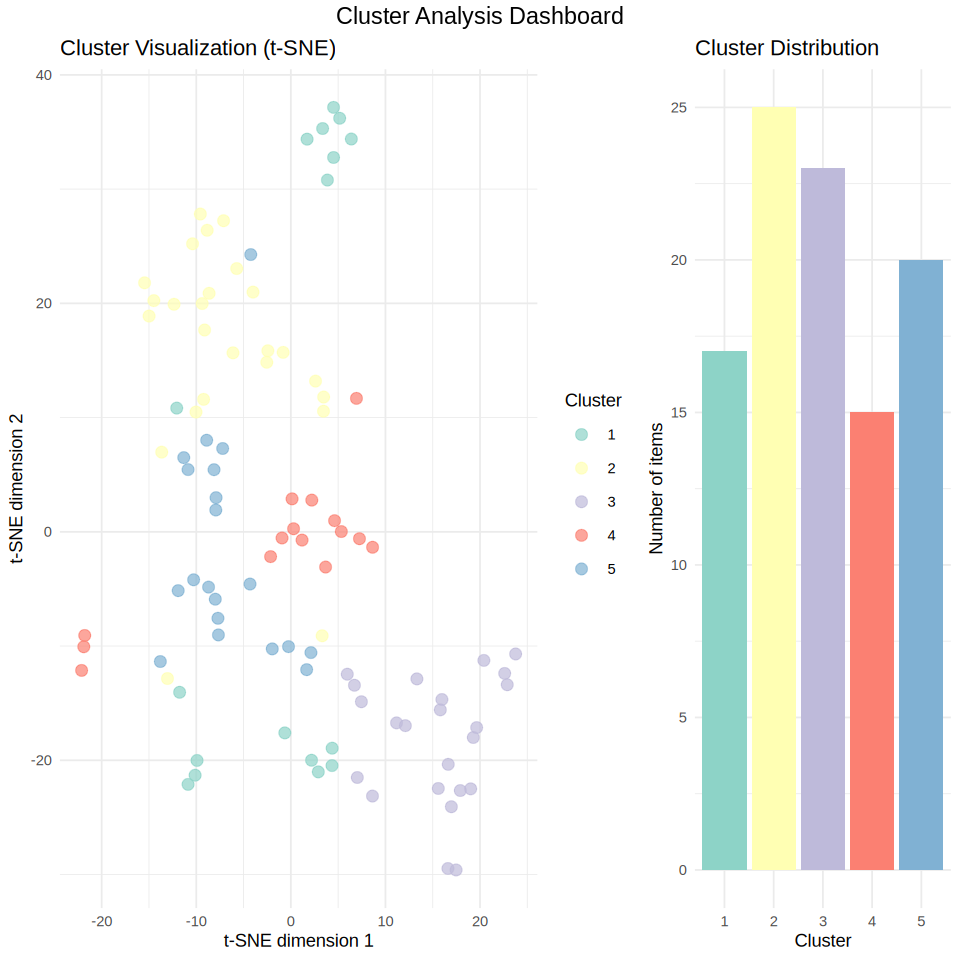

* installing *source* package ‘Rtsne’ ...
** this is package ‘Rtsne’ version ‘0.17’
** package ‘Rtsne’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
using C++ compiler: ‘g++ (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0’
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG  -I'/usr/local/lib/R/site-library/Rcpp/include'    -fopenmp -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -ffile-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=. -fstack-protector-strong -fstack-clash-protection -Wformat -Werror=format-security -fcf-protection -fdebug-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=/usr/src/r-base-4.5.1-1.2404.0 -Wdate-time -D_FORTIFY_SOURCE=3   -c RcppExports.cpp -o RcppExports.o
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG  -I'/usr/local/lib/R/site-library/Rcpp/include'    -fopenmp -fpic  -g -O2 -fno-omit-frame-pointer -mno-omit-leaf-frame-pointer -ffile-prefix-map=/build/r-base-wwoKA3/r-base-4.5.1=. -fstack-protector-strong -fstack-cla

In [0]:
%r
# 1. 必要なライブラリのロード
if (!require("Rtsne")) install.packages("Rtsne")
if (!require("ggplot2")) install.packages("ggplot2")
if (!require("gridExtra")) install.packages("gridExtra") # 横並び表示用
library(Rtsne)
library(ggplot2)
library(gridExtra)
library(dplyr)

# --- A. データの型変換と準備 ---
pdf <- as.data.frame(clustered_df)

# ベクトル列を数値行列に変換
vectors <- do.call(rbind, lapply(pdf$`__db_content_summary_vector`, function(x) as.numeric(unlist(x))))
storage.mode(vectors) <- "numeric"

# t-SNE実行
print("Performing t-SNE dimensionality reduction...")
set.seed(42)
perp_val <- min(5, max(2, floor(nrow(vectors) / 3)))
tsne_out <- Rtsne(vectors, dims = 2, perplexity = perp_val, check_duplicates = FALSE)

# プロット用データフレーム
plot_df <- data.frame(
  x = tsne_out$Y[, 1],
  y = tsne_out$Y[, 2],
  cluster = as.factor(pdf$cluster_id),
  text = pdf$content_summary
)

# --- B. ggplot2 によるプロット作成 ---

# カラーパレットの設定 (Set3)
color_palette <- scale_fill_brewer(palette = "Set3")
color_palette_scatter <- scale_color_brewer(palette = "Set3")

# 1. 左側：t-SNE 散布図
p1 <- ggplot(plot_df, aes(x = x, y = y, color = cluster)) +
  geom_point(size = 3, alpha = 0.7) +
  theme_minimal() +
  labs(title = "Cluster Visualization (t-SNE)",
       x = "t-SNE dimension 1",
       y = "t-SNE dimension 2",
       color = "Cluster") +
  color_palette_scatter

# 2. 右側：クラスター分布（棒グラフ）
dist_data <- plot_df %>% group_by(cluster) %>% summarize(count = n())
p2 <- ggplot(dist_data, aes(x = cluster, y = count, fill = cluster)) +
  geom_bar(stat = "identity", show.legend = FALSE) +
  theme_minimal() +
  labs(title = "Cluster Distribution",
       x = "Cluster",
       y = "Number of items") +
  color_palette

# --- C. 横並びにして表示 ---
# grid.arrange を使うことで、Databricks上で画像として確実に出力されます
grid.arrange(p1, p2, ncol = 2, widths = c(2, 1), top = "Cluster Analysis Dashboard")

# --- D. 統計情報の表示 ---
cat("\nDetailed Cluster Statistics:\n")
stats <- dist_data %>%
  mutate(Percentage = round(count / sum(count) * 100, 2)) %>%
  rename(Cluster = cluster, Count = count)
print(as.data.frame(stats))

In [0]:
%r
# plot_dfがRのデータフレームとして存在する場合
display(plot_df)

x,y,cluster,text
3.4510503197515185,10.5568325807893,2,コールセンターに新規のインターネットサービス申し込みがありました。申し込みの際、顧客の情報を確認し、光回線のプランについて説明しました。プレミアムプランに興味があり、月額料金と初期費用について確認しました。キャンペーン中で工事費が無料になることを知り、プレミアムプランで申し込みました。内容確認の上、後日担当者よりご連絡の上、手続きを進めました。
-11.759711526688156,-14.04810776785868,1,"コールセンター担当者はお客様の個人情報保護に努め、お客様の番号を確認しました。お客様の契約内容を確認し、現在のプランは月額3,000円のデータ無制限プランであることを伝えました。お客様はプランの変更を希望し、担当者はより安いプランへの変更を提案しました。変更手続きを進め、確認メールを送信し、変更内容の確認のお電話は不要であることを確認しました。変更手続きは完了し、担当者は今後ともサービスをご愛顧いただけますようお願いしました。"
15.80115880146797,-15.587125231893198,3,お客様は新しい携帯電話の契約をしたいと考えていました。コールセンターのスタッフは、新規契約の手続きを進め、データ通信量が多いプランを提案しました。お客様はそのプランを選択し、申し込み手続きを進めました。必要な情報を提供し、契約内容を確認しました。手続きは完了し、後日契約内容の詳細を記載した書類が送られました。
-21.79378876780813,-9.071874535419028,4,お客様は先月の電気代について確認したいことがあり、コールセンターに電話しました。スタッフはお客様の契約番号を確認し、請求額を調べました。お客様はいつもより高い請求額に疑問を感じていましたが、検針結果に間違いはなかったため、他の要因を調査しました。調査の結果、最近の電気料金の単価変更が請求額に影響していることがわかりました。スタッフはお客様にご不便をおかけしたことをお詫びし、ご不明点やご心配なことがあればいつでも連絡してほしいと伝えました。
7.027685394182927,-21.507816447322273,3,"お客様は先日申し込んだプランについて確認したいことがあり、コールセンターに電話しました。担当者はお客様の契約内容を確認し、現在のプランが月額3,000円のベーシックプランであることを確認しました。お客様はデータ容量が足りないと感じており、プランの変更を検討していました。担当者はスタンダードプランとプレミアムプランを案内し、お客様はスタンダードプランに変更したいと希望しました。担当者は変更手続きを完了し、変更内容をメールで送信しました。"
23.765777211024318,-10.693709350443745,3,お客様は住所変更の手続きを依頼しました。コールセンターはお客様の情報を確認し、新しい住所を登録しました。変更の手続きが完了し、以降は新しい住所に郵送物などが送られることになりました。
3.3590609853051414,35.30257898771676,1,お客様はサービスに満足できず、解約を希望していました。サービス速度が遅く、接続が頻繁に切れることが原因でした。オペレーターは解約手続きを進め、違約金は発生しないことを確認しました。解約の効力発生は7営業日後となりました。最終的なご請求は次回の請求時にお知らせすることになりました。
-8.122805006055765,5.438000374583447,5,コールセンターのスタッフはお客様から電話を受け、契約内容の確認とプランの変更を手伝いました。お客様は月額5000円のプランから月額3000円のプランに変更することを希望し、スタッフは変更手続きを完了しました。変更内容の詳細はメールで送信される予定でした。
-4.2381496015330375,24.2693013973101,5,山田太郎さんは、コールセンターに電話し、インターネットサービスの解約を希望しました。契約番号を確認した後、解約の理由は引越しによるものだと説明しました。オペレーターは解約手続きを進め、来月末をもって解約することを確認しました。解約に伴う詳細は後ほどメールで送付することを伝えました。
1.1844159533085297,-0.7248318229709239,4,コールセンターのスタッフはお客様から先月分の請求書についての確認を求められました。お客様の契約内容を確認した後、請求明細を説明し、通話料が高い理由について詳しく調べました。家族割引の対象番号への長時間通話による割増料金が適用されたことが原因でした。スタッフは請求金額に間違いがないことを確認し、お客様の理解を得て対応を終了しました。


## ラベリングとダッシュボードによる可視化
- AIを用いてラベリングを行います
  - AIラベリングについては、Rで実装するとwarningが出てしまい、そのwaringがラベリング結果となった
- ラベリングとクラスタリングのデータをJoinさせて、Unity Catalog上で開けるダッシュボードで可視化をします

In [0]:
%r
library(dplyr)
library(SparkR)

# 1. AI関数を使用してラベルを生成する関数 (修正版)
generate_label_sql <- function(question, args_sample, args_sample_outside, prompt, model) {
  
  # テキストの整形
  outside_text <- paste0("\n * ", paste(args_sample_outside, collapse = "\n * "))
  inside_text <- paste0("\n * ", paste(args_sample, collapse = "\n * "))
  
  # 入力テキストを1つの大きなコンテキストとして構築
  # プロンプトと入力を明確に分けるため、セパレーターを入れる
  full_input <- sprintf(
    "システム指示: %s\n\nコンサルテーションの質問: %s\n\nクラスター外の例:\n%s\n\nクラスター内の例:\n%s\n\nラベル(1つだけ):",
    prompt, question, outside_text, inside_text
  )
  
  # SQLインジェクションとクエリ構文エラーを防ぐためシングルクォートをエスケープ
  safe_input <- gsub("'", "''", full_input)
  
  # 【修正ポイント】
  # パラメータを個別に渡すと内部スキーマエラーが起きやすいため、
  # 最もシンプルな「モデル名 + 全テキスト」の2引数形式にします。
  query <- sprintf(
    "SELECT ai_query('%s', '%s') as label",
    model, safe_input
  )
  
  # 実行とエラーハンドリング
  result <- tryCatch({
    res_df <- as.data.frame(SparkR::sql(query))
    label_text <- trimws(res_df[1, "label"])
    # 不要な引用符などが含まれる場合を考慮して掃除
    gsub('^"|"$', '', label_text)
  }, error = function(e) {
    # 特定のAI関数が失敗した場合、別の関数(ai_gen)を試みるフォールバック
    cat("Warning: ai_query failed, trying alternative...\n")
    alt_query <- sprintf("SELECT ai_gen('%s') as label", safe_input)
    tryCatch({
      res_df <- as.data.frame(SparkR::sql(alt_query))
      return(trimws(res_df[1, "label"]))
    }, error = function(e2) {
      return(paste("Error generating label:", e2$message))
    })
  })
  
  return(result)
}

# 2. メインのラベリングループ処理 (変更なし)
labelling_r_native <- function(config, plot_df) {
  sample_size <- config$labelling$sample_size
  prompt <- config$labelling$prompt
  model <- config$labelling$model
  question <- config$question
  
  cluster_ids <- unique(plot_df$cluster)
  results <- data.frame()
  
  for (i in seq_along(cluster_ids)) {
    target_id <- cluster_ids[i]
    cat(sprintf("Processing Cluster: %s (%d/%d)...\n", target_id, i, length(cluster_ids)))
    
    # R標準のsampleを使用して抽出
    inside_pool <- plot_df %>% filter(cluster == target_id) %>% pull(text)
    args_sample <- base::sample(inside_pool, size = min(length(inside_pool), sample_size))
    
    outside_pool <- plot_df %>% filter(cluster != target_id) %>% pull(text)
    args_sample_outside <- base::sample(outside_pool, size = min(length(outside_pool), sample_size))
    
    # AI経由でラベル取得
    label <- generate_label_sql(question, args_sample, args_sample_outside, prompt, model)
    
    results <- rbind(results, data.frame(
      cluster_id = target_id, 
      label = label, 
      stringsAsFactors = FALSE
    ))
  }
  
  return(results)
}

# --- 設定と実行 ---
config <- list(
  labelling = list(
    sample_size = 5,
    prompt = "あなたは 、コンサルテーションの議論を分類するラベリングアシスタン›
›トです 。ある議論のまとまり（ クラスター ）に対して 、その内容を端的に表すラベルを1つ作成›
›してください 。クラスターの主な話題 、関連する問い合わせのリスト 、関係ない問い合わせの›
›リストが与えられます 。ラベルは以下のルールに従ってください ：
‧質問からすでに明らかな⽂脈は含めない
‧「 〜に関すること 」「 〜についての問い合わせ 」「 〜を⾏う 」といった表現は使わない
‧名詞で終わるのではなく 、「 〜の変更 」「 〜の依頼 」など動詞を体⾔⽌めで終える
‧簡潔であること
‧クラスター内と外の問い合わせを正しく区別できるよう 、⼗分な正確さをもつこと
回答はラベルのみを返してください 。",
    model = "databricks-meta-llama-3-3-70b-instruct"
  ),
  question = "これらの問い合わせの主なテーマは何か?"
)

# 実行
res <- labelling_r_native(config, plot_df)
display(res)

cluster_id,label
2,"Error generating label: error in evaluating the argument 'x' in selecting a method for function 'as.data.frame': org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 23.0 failed 4 times, most recent failure: Lost task 0.3 in stage 23.0 (TID 51) (ip-10-49-167-75.ap-northeast-1.compute.internal executor driver): org.apache.spark.SparkException: [INTERNAL_ERROR] ai_gen is NOT supported in UnsafeAIFunctionProjection SQLSTATE: XX000 at org.apache.spark.SparkException$.internalError(SparkException.scala:114) at org.apache.spark.SparkException$.internalError(SparkException.scala:118) at org.apache.spark.sql.execution.UnsafeAIFunctionProjection.$anonfun$apply$2(BatchEvalScalaExec.scala:95) at scala.collection.IterableOnceOps.foreach(IterableOnce.scala:619) at scala.collection.IterableOnceOps.foreach$(IterableOnce.scala:617) at scala.collection.AbstractIterable.foreach(Iterable.scala:935) at scala.collection.IterableOps$WithFilter.foreach(Iterable.scala:905) at org.apache.spark.s"
1,"Error generating label: error in evaluating the argument 'x' in selecting a method for function 'as.data.frame': org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 25.0 failed 4 times, most recent failure: Lost task 0.3 in stage 25.0 (TID 59) (ip-10-49-167-75.ap-northeast-1.compute.internal executor driver): org.apache.spark.SparkException: [INTERNAL_ERROR] ai_gen is NOT supported in UnsafeAIFunctionProjection SQLSTATE: XX000 at org.apache.spark.SparkException$.internalError(SparkException.scala:114) at org.apache.spark.SparkException$.internalError(SparkException.scala:118) at org.apache.spark.sql.execution.UnsafeAIFunctionProjection.$anonfun$apply$2(BatchEvalScalaExec.scala:95) at scala.collection.IterableOnceOps.foreach(IterableOnce.scala:619) at scala.collection.IterableOnceOps.foreach$(IterableOnce.scala:617) at scala.collection.AbstractIterable.foreach(Iterable.scala:935) at scala.collection.IterableOps$WithFilter.foreach(Iterable.scala:905) at org.apache.spark.s"
3,"Error generating label: error in evaluating the argument 'x' in selecting a method for function 'as.data.frame': org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 27.0 failed 4 times, most recent failure: Lost task 0.3 in stage 27.0 (TID 67) (ip-10-49-167-75.ap-northeast-1.compute.internal executor driver): org.apache.spark.SparkException: [INTERNAL_ERROR] ai_gen is NOT supported in UnsafeAIFunctionProjection SQLSTATE: XX000 at org.apache.spark.SparkException$.internalError(SparkException.scala:114) at org.apache.spark.SparkException$.internalError(SparkException.scala:118) at org.apache.spark.sql.execution.UnsafeAIFunctionProjection.$anonfun$apply$2(BatchEvalScalaExec.scala:95) at scala.collection.IterableOnceOps.foreach(IterableOnce.scala:619) at scala.collection.IterableOnceOps.foreach$(IterableOnce.scala:617) at scala.collection.AbstractIterable.foreach(Iterable.scala:935) at scala.collection.IterableOps$WithFilter.foreach(Iterable.scala:905) at org.apache.spark.s"
4,"Error generating label: error in evaluating the argument 'x' in selecting a method for function 'as.data.frame': org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 29.0 failed 4 times, most recent failure: Lost task 0.3 in stage 29.0 (TID 75) (ip-10-49-167-75.ap-northeast-1.compute.internal executor driver): org.apache.spark.SparkException: [INTERNAL_ERROR] ai_gen is NOT supported in UnsafeAIFunctionProjection SQLSTATE: XX000 at org.apache.spark.SparkException$.internalError(SparkException.scala:114) at org.apache.spark.SparkException$.internalError(SparkException.scala:118) at org.apache.spark.sql.execution.UnsafeAIFunctionProjection.$anonfun$apply$2(BatchEvalScalaExec.scala:95) at scala.collection.IterableOnceOps.foreach(IterableOnce.scala:619) at scala.collection.IterableOnceOps.foreach$(IterableOnce.scala:617) at scala.collection.AbstractIterable.foreach(Iterable.scala:93

Processing Cluster: 2 (1/5)...
Processing Cluster: 1 (2/5)...
Processing Cluster: 3 (3/5)...
Processing Cluster: 4 (4/5)...
Processing Cluster: 5 (5/5)...

In [0]:
%r
### R (SparkR) での書き換え
# 1. RのデータフレームをSparkのDataFrameに変換
spark_plot_df <- SparkR::as.DataFrame(plot_df)

# 2. テーブルとして保存（mode="overwrite" を指定）
SparkR::saveAsTable(
  spark_plot_df, 
  tableName = " {catalog}.{schema}.calls_log_silver_cluster_plot_result", 
  source = "delta", 
  mode = "overwrite"
)

In [0]:
%r
### R (SparkR) での書き換え
# 1. Rのデータフレーム res を Spark DataFrame に変換
spark_res_df <- SparkR::as.DataFrame(res)

# 2. 指定のカタログ・スキーマ・テーブル名で保存 (mode="overwrite")
SparkR::saveAsTable(
  spark_res_df, 
  tableName = " {catalog}.{schema}.calls_log_silver_cluster_result", 
  source = "delta", 
  mode = "overwrite"
)

In [0]:
%r
### R (SparkR) での実行

# 1. カタログとスキーマの設定
# CATALOG, SCHEMA が R の変数として定義されていることを想定しています
SparkR::sql(sprintf("USE CATALOG %s", CATALOG))
SparkR::sql(sprintf("USE SCHEMA %s", SCHEMA))

# 2. テーブルの結合と作成 (CREATE OR REPLACE TABLE)
# b.`cluster-id` のバッククォートに注意して文字列を作成します
query <- "
CREATE OR REPLACE TABLE calls_log_gold_cluster_result AS
SELECT
  a.x,
  a.y,
  a.cluster,
  a.text,
  b.label
FROM
   {catalog}.{schema}.calls_log_silver_cluster_plot_result a 
LEFT JOIN 
   {catalog}.{schema}.calls_log_silver_cluster_result b
ON 
  a.cluster = b.`cluster_id`
"

# クエリの実行
SparkR::sql(query)

SparkDataFrame[num_affected_rows:bigint, num_inserted_rows:bigint]